## Data Cleaning

In [ ]:


# import pandas as pd

# # Path to your CSV file
# csv_file = "US_Accidents_March23.csv"

# # Convert to Parquet format
# parquet_file = "data_files/large_file.parquet"
# df = pd.read_csv(csv_file)
# df.to_parquet(parquet_file, engine='pyarrow', compression='snappy')
# print(f"File successfully converted to {parquet_file}")

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_parquet("/content/drive/MyDrive/Techstax/large_file.parquet")

In [3]:
test=data.sample(100)
test.to_csv("test.csv")

In [41]:
data.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day


In [ ]:
data.iloc[:,9:23].head()

,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%)
0,0.01,Right lane blocked due to accident on I-70 Eas...,I-70 E,Dayton,Montgomery,OH,45424,US,US/Eastern,KFFO,2016-02-08 05:58:00,36.9,NaN,91.0
1,0.01,Accident on Brice Rd at Tussing Rd. Expect del...,Brice Rd,Reynoldsburg,Franklin,OH,43068-3402,US,US/Eastern,KCMH,2016-02-08 05:51:00,37.9,NaN,100.0
2,0.01,Accident on OH-32 State Route 32 Westbound at ...,State Route 32,Williamsburg,Clermont,OH,45176,US,US/Eastern,KI69,2016-02-08 06:56:00,36.0,33.3,100.0
3,0.01,Accident on I-75 Southbound at Exits 52 52B US...,I-75 S,Dayton,Montgomery,OH,45417,US,US/Eastern,KDAY,2016-02-08 07:38:00,35.1,31.0,96.0
4,0.01,Accident on McEwen Rd at OH-725 Miamisburg Cen...,Miamisburg Centerville Rd,Dayton,Montgomery,OH,45459,US,US/Eastern,KMGY,2016-02-08 07:53:00,36.0,33.3,89.0


In [ ]:
data.iloc[:,23:37].head()

,Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout
0,29.68,10.0,Calm,NaN,0.02,Light Rain,False,False,False,False,False,False,False,False
1,29.65,10.0,Calm,NaN,0.00,Light Rain,False,False,False,False,False,False,False,False
2,29.67,10.0,SW,3.5,NaN,Overcast,False,False,False,False,False,False,False,False
3,29.64,9.0,SW,4.6,NaN,Mostly Cloudy,False,False,False,False,False,False,False,False
4,29.65,6.0,SW,3.5,NaN,Mostly Cloudy,False,False,False,False,False,False,False,False


In [ ]:
data.isnull().sum()

,0
ID,0
Source,0
Severity,0
Start_Time,0
End_Time,0
Start_Lat,0
Start_Lng,0
End_Lat,3402762
End_Lng,3402762
Distance(mi),0


In [ ]:

# Calculate the percentage of missing values for each column
missing_percentage = data.isnull().sum() * 100 / len(data)

# Create a DataFrame to display the results
missing_df = pd.DataFrame({'Column Name': missing_percentage.index, 'Missing Percentage': missing_percentage.values})

# Sort the DataFrame by missing percentage in descending order
missing_df = missing_df.sort_values(by='Missing Percentage', ascending=False)

# Display the DataFrame
print(missing_df)


# Calculate total missing values
total_missing = data.isnull().sum().sum()
total_cells = np.product(data.shape)
percent_missing_total = (total_missing / total_cells) * 100

print(f"\nTotal Percentage of Missing Values in the Dataset: {percent_missing_total:.2f}%")

              Column Name  Missing Percentage
7                 End_Lat           44.029355
8                 End_Lng           44.029355
27      Precipitation(in)           28.512858
21          Wind_Chill(F)           25.865904
26        Wind_Speed(mph)            7.391355
24         Visibility(mi)            2.291524
25         Wind_Direction            2.267043
22            Humidity(%)            2.253301
28      Weather_Condition            2.244438
20         Temperature(F)            2.120143
23           Pressure(in)            1.820288
19      Weather_Timestamp            1.555666
44      Nautical_Twilight            0.300787
43         Civil_Twilight            0.300787
42         Sunrise_Sunset            0.300787
45  Astronomical_Twilight            0.300787
18           Airport_Code            0.292881
11                 Street            0.140637
17               Timezone            0.101030
15                Zipcode            0.024779
12                   City         

In [ ]:

# Concatenate data types and unique counts into a single DataFrame
info_df = pd.DataFrame({'Data Type': data.dtypes, 'Unique Count': data.nunique()})
info_df

,Data Type,Unique Count
ID,object,7728394
Source,object,3
Severity,int64,4
Start_Time,object,6131796
End_Time,object,6705355
Start_Lat,float64,2428358
Start_Lng,float64,2482533
End_Lat,float64,1568172
End_Lng,float64,1605789
Distance(mi),float64,22382


In [ ]:
data.duplicated().sum()

0

In [ ]:
data.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,7.728394e+06,7.728394e+06,7.728394e+06,4.325632e+06,4.325632e+06,7.728394e+06,7.564541e+06,5.729375e+06,7.554250e+06,7.587715e+06,7.551296e+06,7.157161e+06,5.524808e+06
mean,2.212384e+00,3.620119e+01,-9.470255e+01,3.626183e+01,-9.572557e+01,5.618423e-01,6.166329e+01,5.825105e+01,6.483104e+01,2.953899e+01,9.090376e+00,7.685490e+00,8.407210e-03
std,4.875313e-01,5.076079e+00,1.739176e+01,5.272905e+00,1.810793e+01,1.776811e+00,1.901365e+01,2.238983e+01,2.282097e+01,1.006190e+00,2.688316e+00,5.424983e+00,1.102246e-01
min,1.000000e+00,2.455480e+01,-1.246238e+02,2.456601e+01,-1.245457e+02,0.000000e+00,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.339963e+01,-1.172194e+02,3.346207e+01,-1.177543e+02,0.000000e+00,4.900000e+01,4.300000e+01,4.800000e+01,2.937000e+01,1.000000e+01,4.600000e+00,0.000000e+00
50%,2.000000e+00,3.582397e+01,-8.776662e+01,3.618349e+01,-8.802789e+01,3.000000e-02,6.400000e+01,6.200000e+01,6.700000e+01,2.986000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,2.000000e+00,4.008496e+01,-8.035368e+01,4.017892e+01,-8.024709e+01,4.640000e-01,7.600000e+01,7.500000e+01,8.400000e+01,3.003000e+01,1.000000e+01,1.040000e+01,0.000000e+00
max,4.000000e+00,4.900220e+01,-6.711317e+01,4.907500e+01,-6.710924e+01,4.417500e+02,2.070000e+02,2.070000e+02,1.000000e+02,5.863000e+01,1.400000e+02,1.087000e+03,3.647000e+01


In [ ]:
for i in data.columns:
    if (data[i].isnull().sum()/len(data)*100) >10:
        print(f"{i} has {data[i].isnull().sum()/len(data)*100}")

End_Lat has 44.02935461106149
End_Lng has 44.02935461106149
Wind_Chill(F) has 25.86590435218494
Precipitation(in) has 28.512857910712107


In [ ]:
data.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day


In [ ]:
data.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [ ]:
# id End_Lat	End_Lng	Description	Street	City	County	State	Zipcode	Country	Airport_Code	Wind_Chill(F)	Wind_Direction	Precipitation(in)	Weather_Condition

In [4]:
# Based on uniques,missing,single values(default),no use columns to drop and remaining based on EDA analysis we select
data = data.drop(columns=['ID','Source', 'End_Lat',	'End_Lng', 'Weather_Timestamp',	'Description',	'Street',	'City',	'County',	'State',	'Zipcode','Country',	'Airport_Code',	'Wind_Chill(F)',	'Wind_Direction',	'Precipitation(in)',	'Weather_Condition','Turning_Loop','Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight',])

In [5]:
# Convert 'Start_Time' and 'End_Time' to datetime objects
# using format='mixed' and errors='coerce' to handle different formats and invalid values
data['Start_Time'] = pd.to_datetime(data['Start_Time'], format='mixed', errors='coerce')
data['End_Time'] = pd.to_datetime(data['End_Time'], format='mixed', errors='coerce')

# Now calculate the duration
data['Duration'] = (data['End_Time'] - data['Start_Time']).dt.total_seconds() / 60


In [6]:
data.drop(columns=['Start_Time','End_Time'],inplace=True)

In [7]:
data['Duration'].isnull().sum()

0

In [8]:


# Fill missing values based on data type
for col in data.columns:
    if data[col].dtype == 'bool':
        data[col] = data[col].fillna(data[col].mode()[0])  # Fill with mode for boolean
    elif data[col].dtype == 'object':
        data[col] = data[col].fillna(data[col].mode()[0])  # Fill with mode for object
    elif data[col].dtype == 'int64':
        data[col] = data[col].fillna(data[col].mean())  # Fill with mean for int
    elif data[col].dtype == 'float64':
        data[col] = data[col].fillna(data[col].mean())  # Fill with mean for float

In [9]:
data.isnull().sum()

,0
Severity,0
Start_Lat,0
Start_Lng,0
Distance(mi),0
Timezone,0
Temperature(F),0
Humidity(%),0
Pressure(in),0
Visibility(mi),0
Wind_Speed(mph),0


In [10]:
data.shape

(7728394, 24)

In [ ]:
data.columns

Index(['Severity', 'Start_Lat', 'Start_Lng', 'Distance(mi)', 'Timezone',
       'Temperature(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)',
       'Wind_Speed(mph)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Sunrise_Sunset', 'Duration'],
      dtype='object')

In [11]:
data.dtypes

,0
Severity,int64
Start_Lat,float64
Start_Lng,float64
Distance(mi),float64
Timezone,object
Temperature(F),float64
Humidity(%),float64
Pressure(in),float64
Visibility(mi),float64
Wind_Speed(mph),float64


In [ ]:
# data.drop(columns=['Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight',],inplace=True)
 # Retain Sunrise_Sunset because it's the most straightforward representation of light conditions.

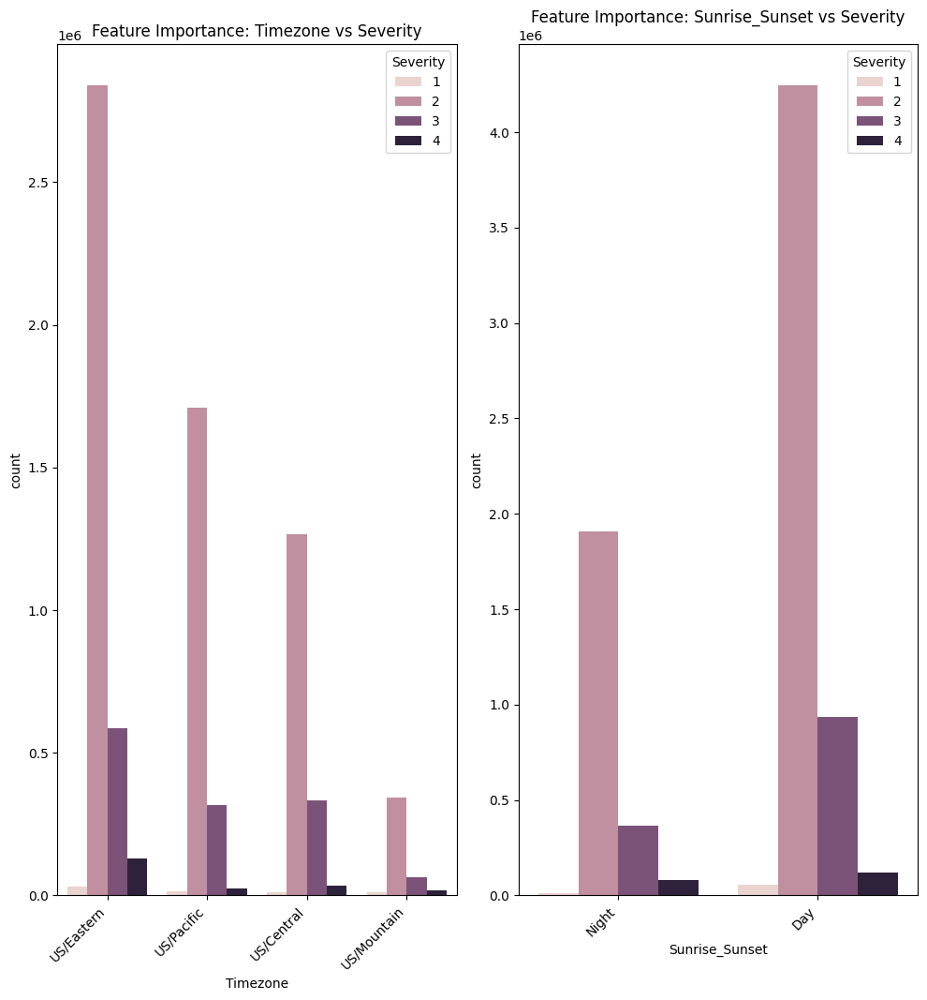

In [ ]:


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' DataFrame is already loaded and preprocessed as shown in the previous code

# Identify object columns
object_cols = data.select_dtypes(include='object').columns

# Loop through object columns and create countplots
plt.figure(figsize=(10, 20))  # Adjust figure size as needed
for i, col in enumerate(object_cols):
    plt.subplot(len(object_cols), 2, i + 1)  # Create subplots for each column
    sns.countplot(x=col, hue='Severity', data=data)  # Create countplot with 'Severity' as hue
    plt.title(f'Feature Importance: {col} vs Severity')
    plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for better readability
    plt.tight_layout()

plt.show()

In [ ]:
data.iloc[:,:12].head()

,Severity,Start_Lat,Start_Lng,Distance(mi),Timezone,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Amenity,Bump
0,3,39.865147,-84.058723,0.01,US/Eastern,36.9,91.0,29.68,10.0,7.68549,False,False
1,2,39.928059,-82.831184,0.01,US/Eastern,37.9,100.0,29.65,10.0,7.68549,False,False
2,2,39.063148,-84.032608,0.01,US/Eastern,36.0,100.0,29.67,10.0,3.50000,False,False
3,3,39.747753,-84.205582,0.01,US/Eastern,35.1,96.0,29.64,9.0,4.60000,False,False
4,2,39.627781,-84.188354,0.01,US/Eastern,36.0,89.0,29.65,6.0,3.50000,False,False


In [ ]:
data.iloc[:,12:].head()

,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Duration
0,False,False,False,False,False,False,False,False,False,False,Night,314.0
1,False,False,False,False,False,False,False,False,False,False,Night,30.0
2,False,False,False,False,False,False,False,False,False,True,Night,30.0
3,False,False,False,False,False,False,False,False,False,False,Night,30.0
4,False,False,False,False,False,False,False,False,False,True,Day,30.0


In [ ]:
data.head(5)

,Severity,Start_Lat,Start_Lng,Distance(mi),Timezone,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),...,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Duration
0,3,39.865147,-84.058723,0.01,US/Eastern,36.9,91.0,29.68,10.0,7.68549,...,False,False,False,False,False,False,False,False,Night,314.0
1,2,39.928059,-82.831184,0.01,US/Eastern,37.9,100.0,29.65,10.0,7.68549,...,False,False,False,False,False,False,False,False,Night,30.0
2,2,39.063148,-84.032608,0.01,US/Eastern,36.0,100.0,29.67,10.0,3.50000,...,False,False,False,False,False,False,False,True,Night,30.0
3,3,39.747753,-84.205582,0.01,US/Eastern,35.1,96.0,29.64,9.0,4.60000,...,False,False,False,False,False,False,False,False,Night,30.0
4,2,39.627781,-84.188354,0.01,US/Eastern,36.0,89.0,29.65,6.0,3.50000,...,False,False,False,False,False,False,False,True,Day,30.0


In [ ]:
data.head()

,Severity,Start_Lat,Start_Lng,Distance(mi),Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Amenity,...,Stop,Traffic_Calming,Traffic_Signal,Duration,Source_Source2,Source_Source3,Timezone_US/Eastern,Timezone_US/Mountain,Timezone_US/Pacific,Sunrise_Sunset_Night
0,3,39.865147,-84.058723,0.01,36.9,91.0,29.68,10.0,7.68549,0,...,0,0,0,314.0,True,False,True,False,False,True
1,2,39.928059,-82.831184,0.01,37.9,100.0,29.65,10.0,7.68549,0,...,0,0,0,30.0,True,False,True,False,False,True
2,2,39.063148,-84.032608,0.01,36.0,100.0,29.67,10.0,3.50000,0,...,0,0,1,30.0,True,False,True,False,False,True
3,3,39.747753,-84.205582,0.01,35.1,96.0,29.64,9.0,4.60000,0,...,0,0,0,30.0,True,False,True,False,False,True
4,2,39.627781,-84.188354,0.01,36.0,89.0,29.65,6.0,3.50000,0,...,0,0,1,30.0,True,False,True,False,False,False


## EDA

In [ ]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 94.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 106.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.1/511.1 kB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.9/232.9 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 91.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=d37909a43433552c594a175b27d85af32e3f8fe4e021f979346f84867e5a8772
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9

In [ ]:
import pandas as pd
from ydata_profiling import ProfileReport

# Assuming 'data' DataFrame is already loaded as in your provided code
profiling = data.iloc[:,:]

# Generate the pandas profiling report
profile = ProfileReport(profiling, title="Pandas Profiling Report")

# Display the report in the notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Overview of Data
print("Shape of the data:", data.shape)
print("\nColumns:\n", data.columns)
print("\nData Types:\n", data.dtypes)
print("\nMissing Values:\n", data.isnull().mean() * 100)

Shape of the data: (7728394, 24)

Columns:
 Index(['Severity', 'Start_Lat', 'Start_Lng', 'Distance(mi)', 'Timezone',
       'Temperature(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)',
       'Wind_Speed(mph)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Sunrise_Sunset', 'Duration'],
      dtype='object')

Data Types:
 Severity             int64
Start_Lat          float64
Start_Lng          float64
Distance(mi)       float64
Timezone            object
Temperature(F)     float64
Humidity(%)        float64
Pressure(in)       float64
Visibility(mi)     float64
Wind_Speed(mph)    float64
Amenity               bool
Bump                  bool
Crossing              bool
Give_Way              bool
Junction              bool
No_Exit               bool
Railway               bool
Roundabout            bool
Station               bool
Stop                  bool
Traffic_Calming

In [ ]:
# Univariate Analysis
# Numerical Columns
num_cols = ['Severity', 'Start_Lat', 'Start_Lng', 'Distance(mi)', 'Temperature(F)',
            'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Duration']

# Categorical Columns
cat_cols = ['Timezone', 'Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction',
            'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop', 'Traffic_Calming',
            'Traffic_Signal', 'Sunrise_Sunset']

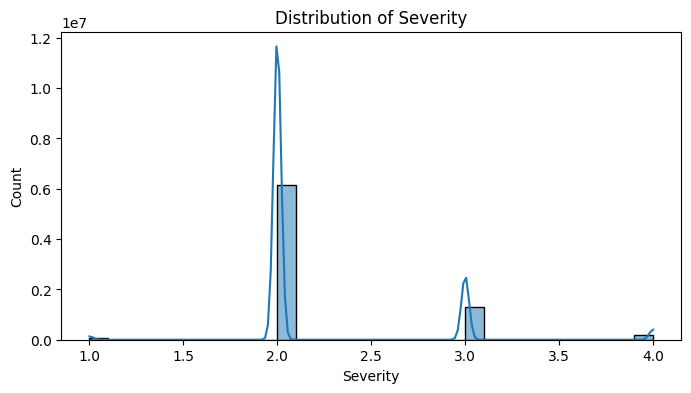

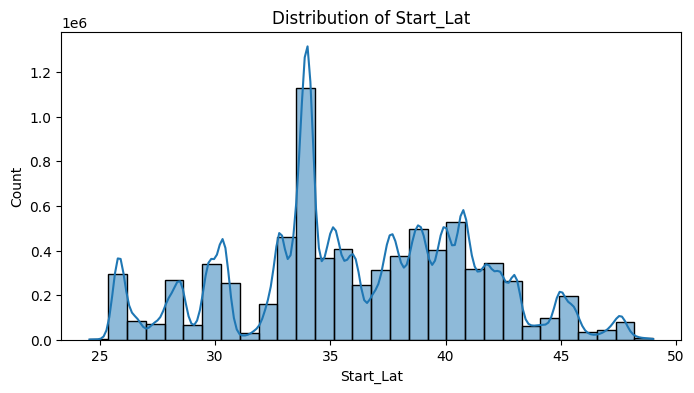

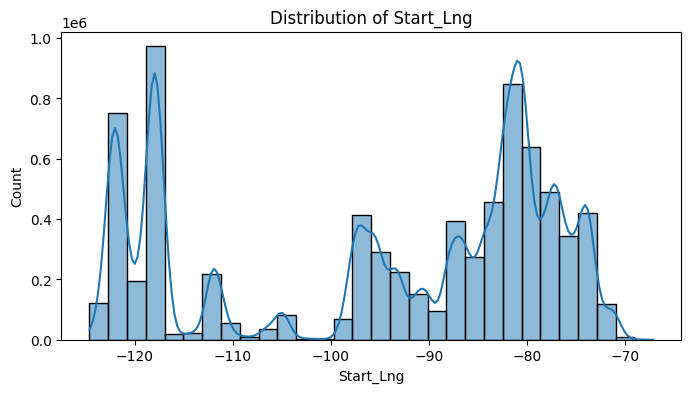

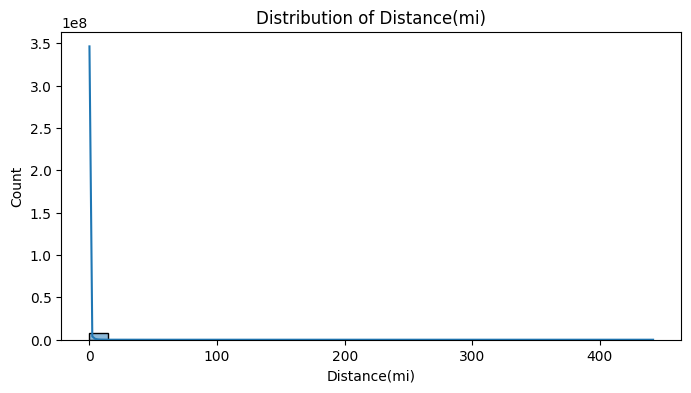

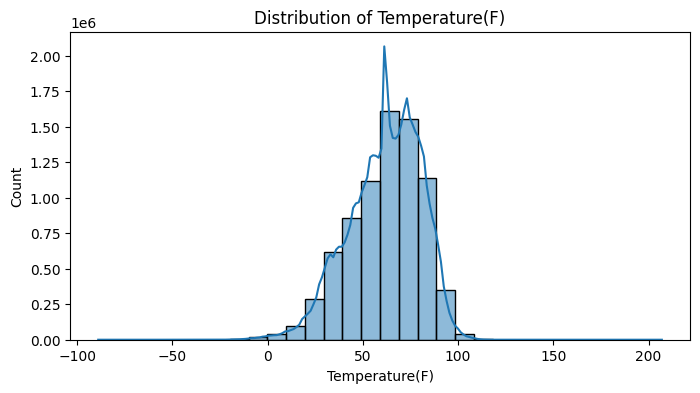

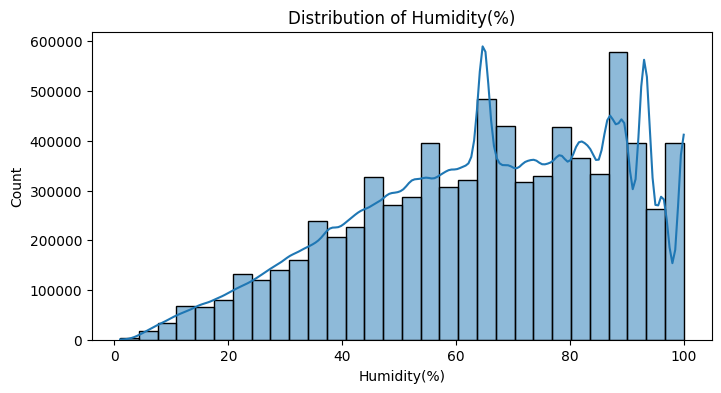

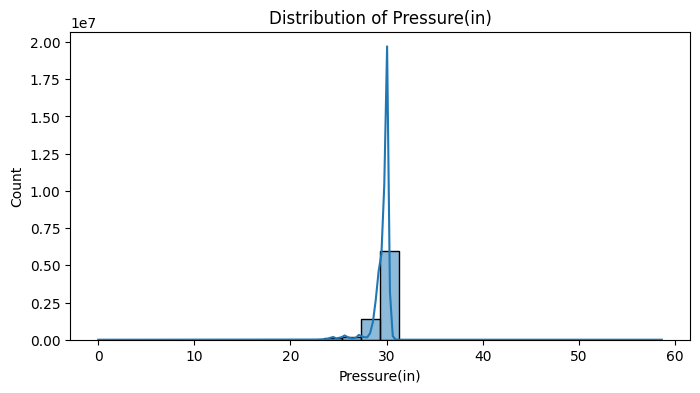

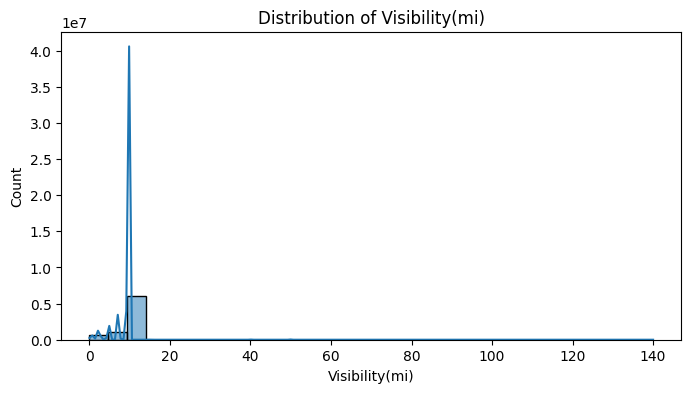

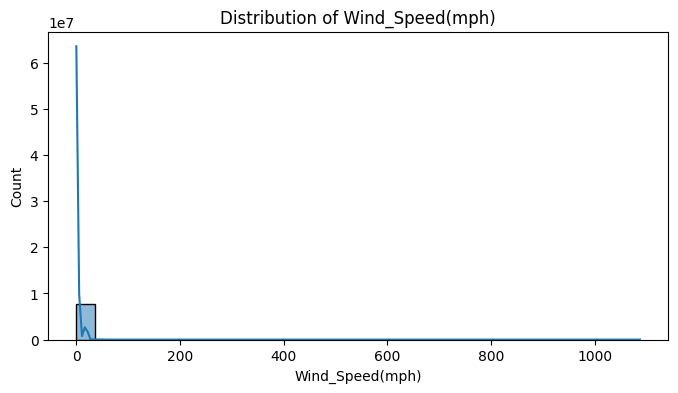

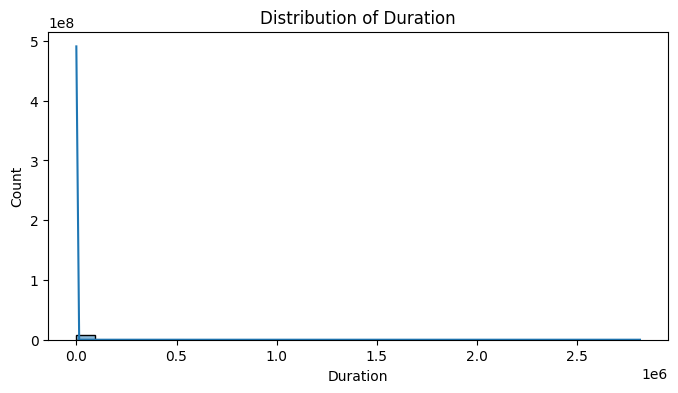

In [ ]:
# Distribution Plots for Numerical Columns
for col in num_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(data[col].dropna(), kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.show()

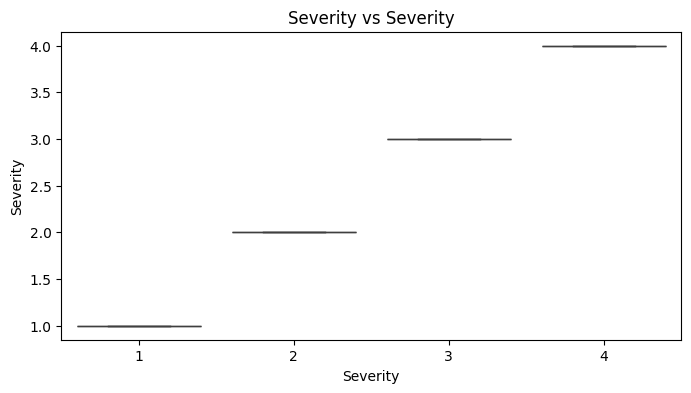

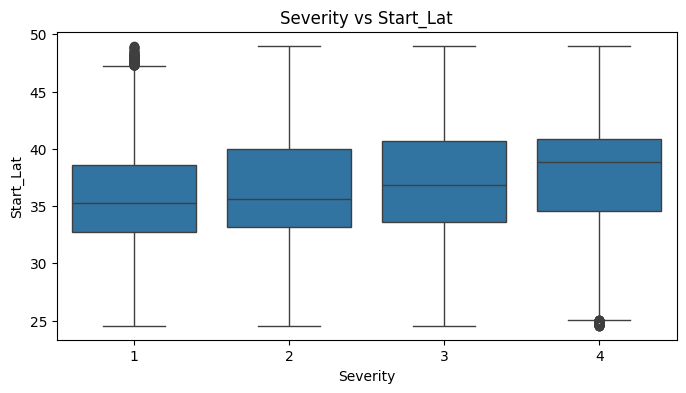

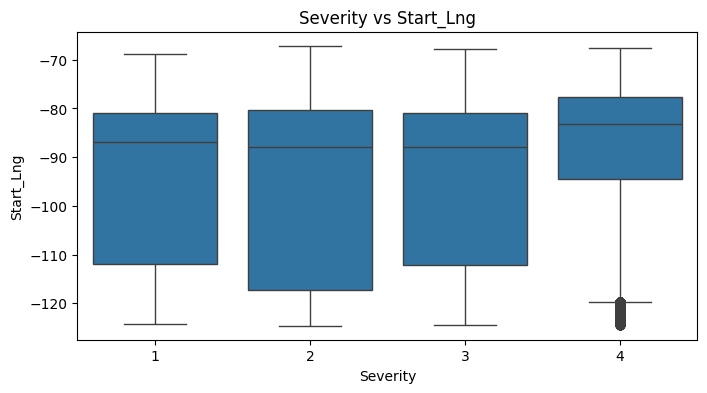

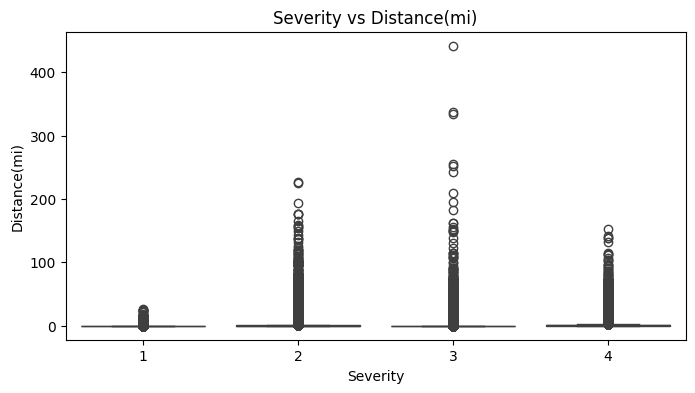

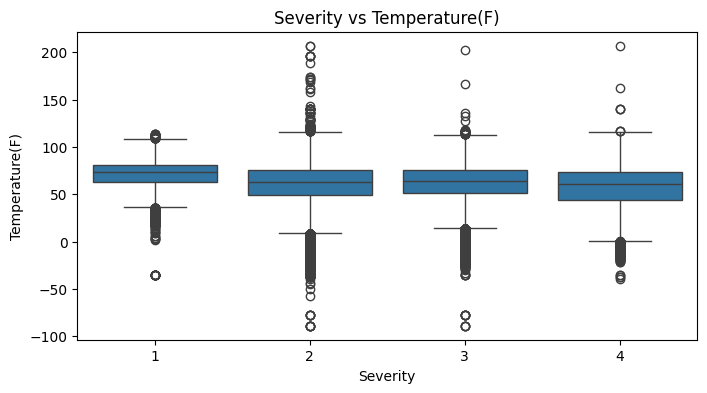

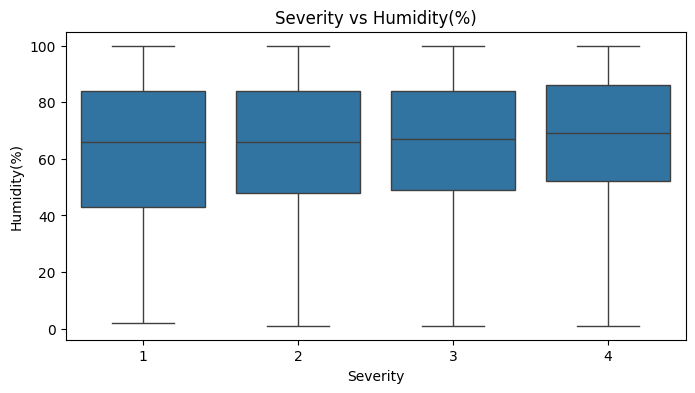

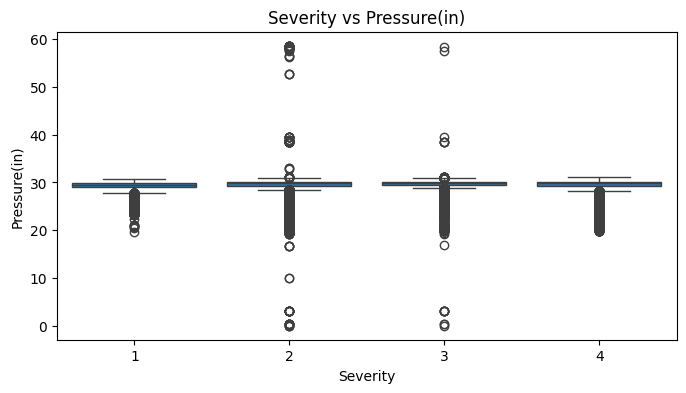

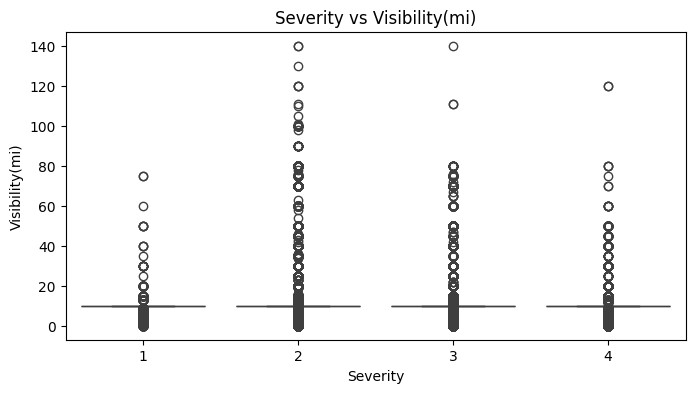

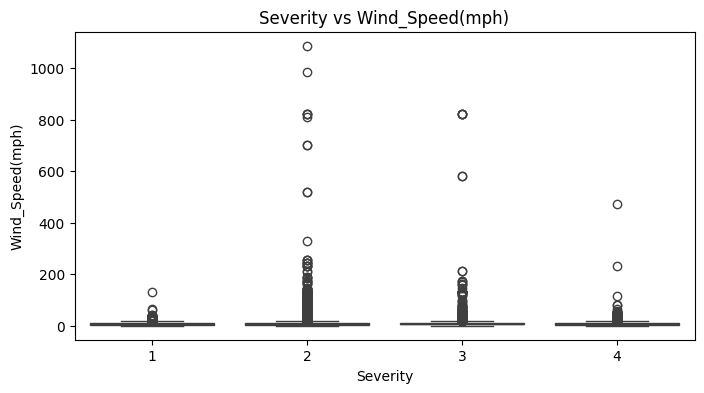

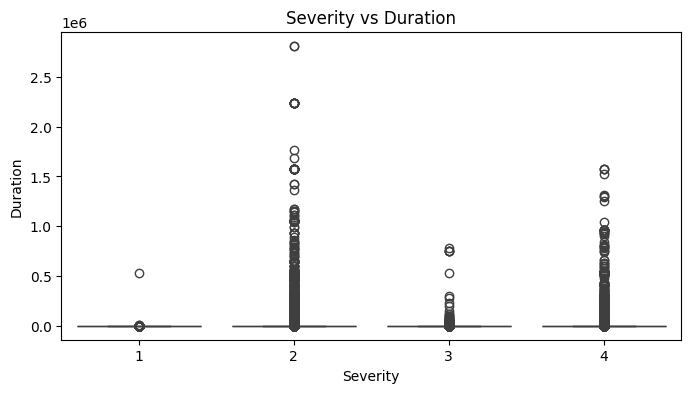

In [ ]:
# Bivariate Analysis
# Severity vs Numerical Columns
for col in num_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x='Severity', y=col, data=data)
    plt.title(f'Severity vs {col}')
    plt.show()

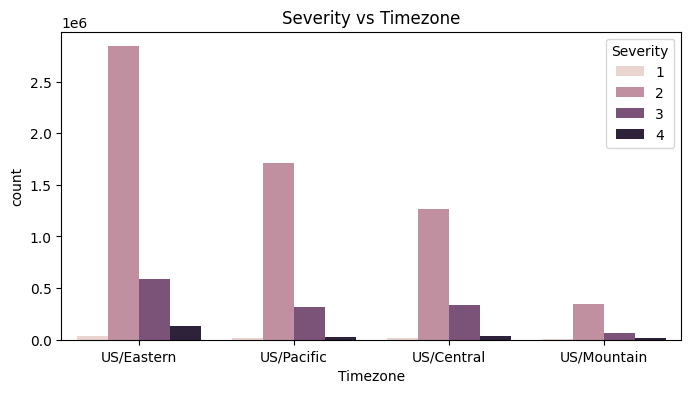

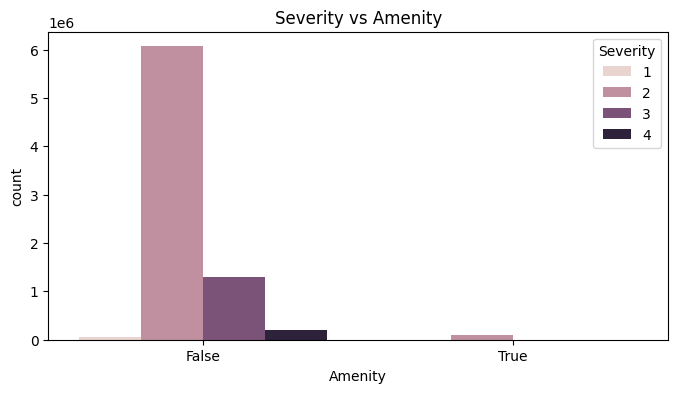

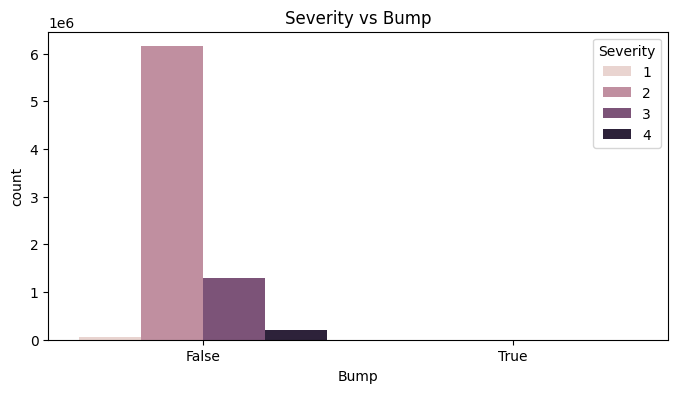

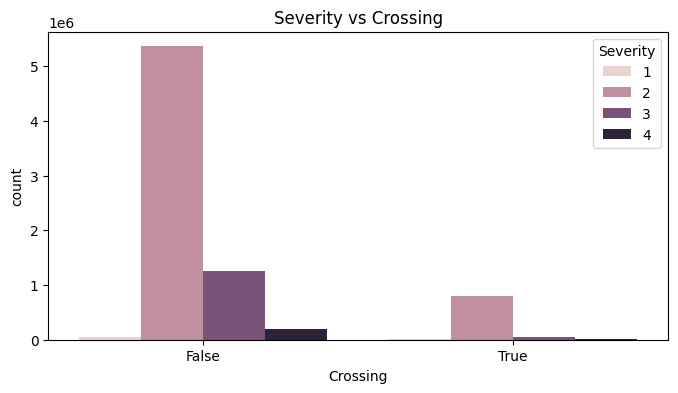

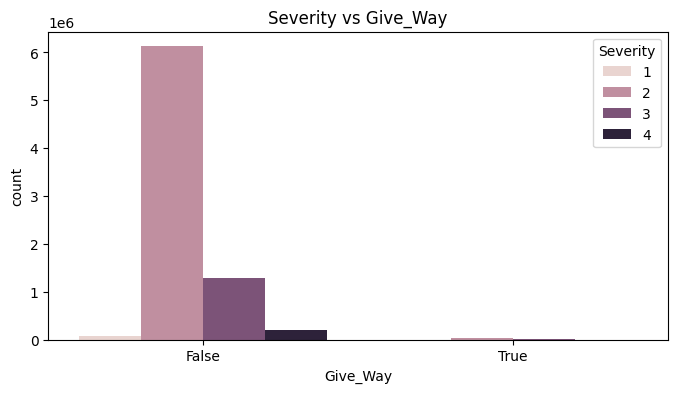

...

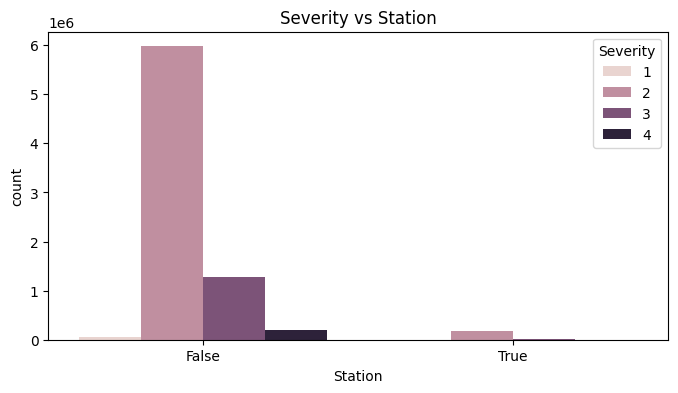

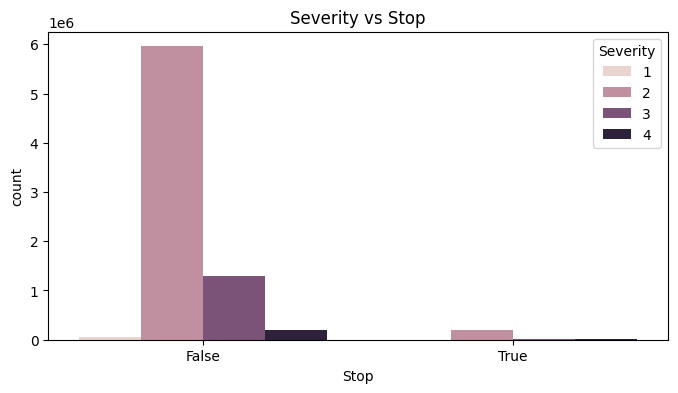

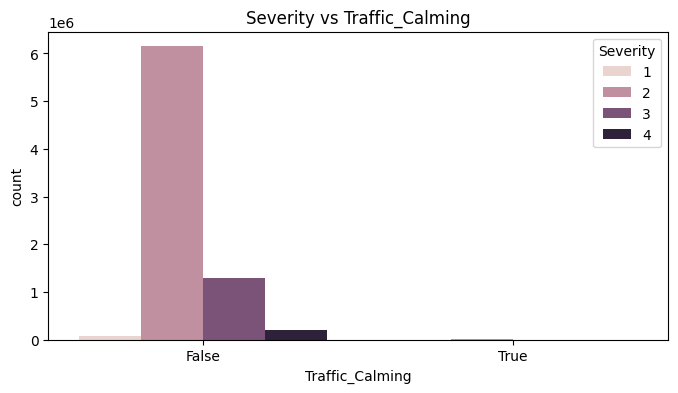

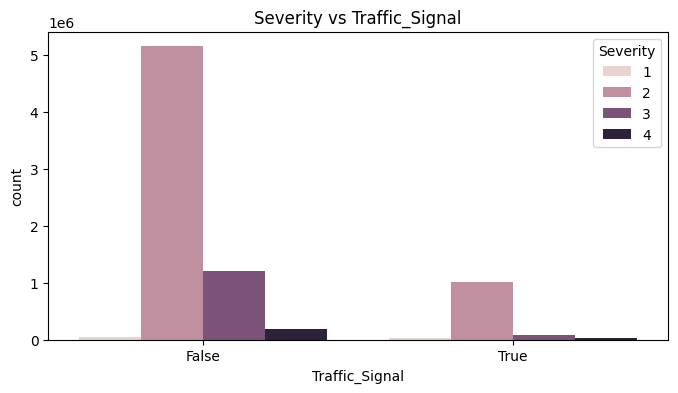

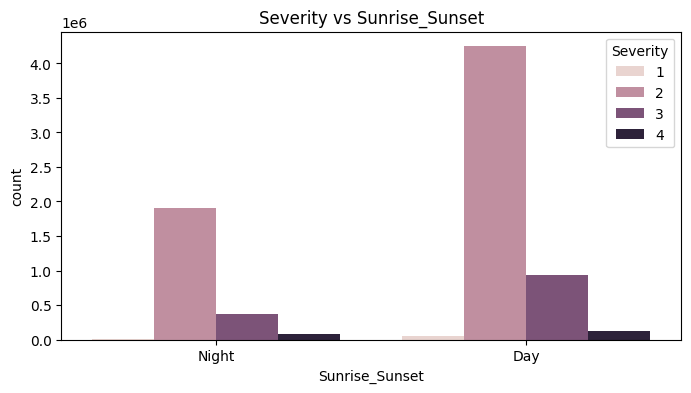

In [ ]:
# Severity vs Categorical Columns
for col in cat_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=data, x=col, hue='Severity')
    plt.title(f'Severity vs {col}')
    plt.show()

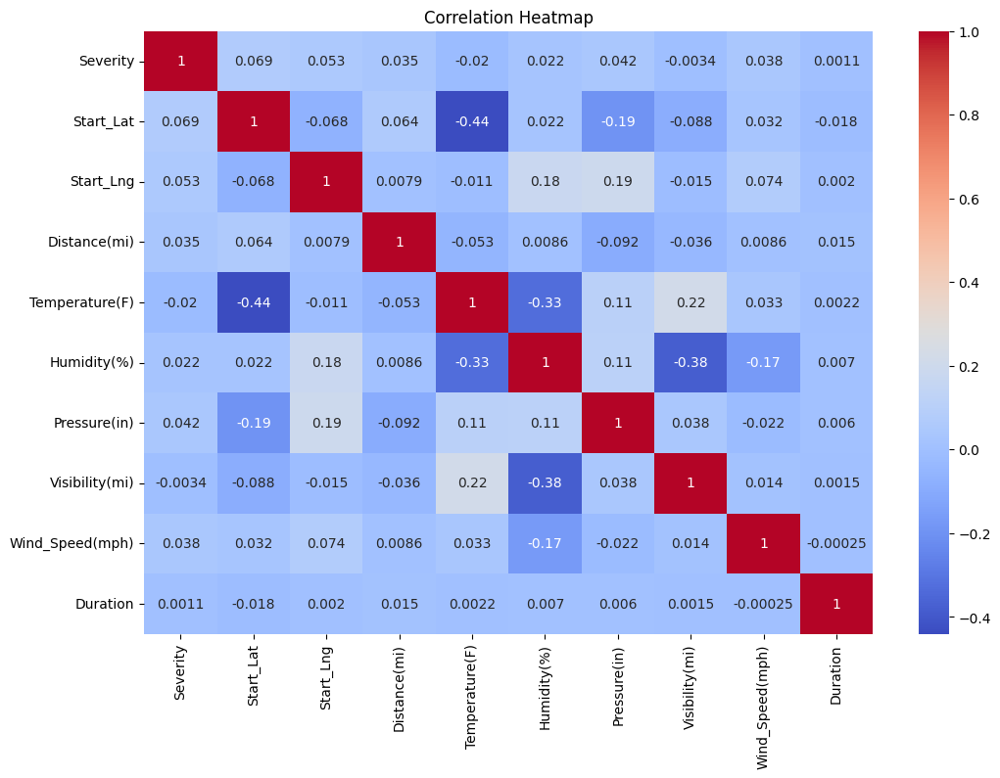

In [ ]:
# Correlation Heatmap
plt.figure(figsize=(12, 8))
corr = data[num_cols].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
# Insights from Data
print("\nUnique values in categorical columns:")
for col in cat_cols:
    print(f"{col}: {data[col].unique()}")

print("\nSummary of numerical columns:")
print(data[num_cols].describe())


Unique values in categorical columns:
Timezone: ['US/Eastern' 'US/Pacific' 'US/Central' 'US/Mountain']
Amenity: [False  True]
Bump: [False  True]
Crossing: [False  True]
Give_Way: [False  True]
Junction: [False  True]
No_Exit: [False  True]
Railway: [False  True]
Roundabout: [False  True]
Station: [False  True]
Stop: [False  True]
Traffic_Calming: [False  True]
Traffic_Signal: [False  True]
Sunrise_Sunset: ['Night' 'Day']

Summary of numerical columns:
           Severity     Start_Lat     Start_Lng  Distance(mi)  Temperature(F)  \
count  7.728394e+06  7.728394e+06  7.728394e+06  7.728394e+06    7.728394e+06   
mean   2.212384e+00  3.620119e+01 -9.470255e+01  5.618423e-01    6.166329e+01   
std    4.875313e-01  5.076079e+00  1.739176e+01  1.776811e+00    1.881102e+01   
min    1.000000e+00  2.455480e+01 -1.246238e+02  0.000000e+00   -8.900000e+01   
25%    2.000000e+00  3.339963e+01 -1.172194e+02  0.000000e+00    5.000000e+01   
50%    2.000000e+00  3.582397e+01 -8.776662e+01  3.00000

## Data preprocessing

In [12]:
data.head()

,Severity,Start_Lat,Start_Lng,Distance(mi),Timezone,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),...,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Duration
0,3,39.865147,-84.058723,0.01,US/Eastern,36.9,91.0,29.68,10.0,7.68549,...,False,False,False,False,False,False,False,False,Night,314.0
1,2,39.928059,-82.831184,0.01,US/Eastern,37.9,100.0,29.65,10.0,7.68549,...,False,False,False,False,False,False,False,False,Night,30.0
2,2,39.063148,-84.032608,0.01,US/Eastern,36.0,100.0,29.67,10.0,3.50000,...,False,False,False,False,False,False,False,True,Night,30.0
3,3,39.747753,-84.205582,0.01,US/Eastern,35.1,96.0,29.64,9.0,4.60000,...,False,False,False,False,False,False,False,False,Night,30.0
4,2,39.627781,-84.188354,0.01,US/Eastern,36.0,89.0,29.65,6.0,3.50000,...,False,False,False,False,False,False,False,True,Day,30.0


In [13]:
# independent and dependent variables

X = data.drop(columns=['Severity'], axis=1)
y = data['Severity']

In [14]:
X.head()

,Start_Lat,Start_Lng,Distance(mi),Timezone,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Amenity,...,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Duration
0,39.865147,-84.058723,0.01,US/Eastern,36.9,91.0,29.68,10.0,7.68549,False,...,False,False,False,False,False,False,False,False,Night,314.0
1,39.928059,-82.831184,0.01,US/Eastern,37.9,100.0,29.65,10.0,7.68549,False,...,False,False,False,False,False,False,False,False,Night,30.0
2,39.063148,-84.032608,0.01,US/Eastern,36.0,100.0,29.67,10.0,3.50000,False,...,False,False,False,False,False,False,False,True,Night,30.0
3,39.747753,-84.205582,0.01,US/Eastern,35.1,96.0,29.64,9.0,4.60000,False,...,False,False,False,False,False,False,False,False,Night,30.0
4,39.627781,-84.188354,0.01,US/Eastern,36.0,89.0,29.65,6.0,3.50000,False,...,False,False,False,False,False,False,False,True,Day,30.0


In [15]:
y.head()

,Severity
0,3
1,2
2,2
3,3
4,2


In [16]:
# Split the dataset into training, validation, and test sets ( 75% train, 15% validation, 10% test).

from sklearn.model_selection import train_test_split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.25, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.4, random_state=42)


In [17]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Identify numerical, boolean, and categorical columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
boolean_cols = X.select_dtypes(include='bool').columns.tolist()
object_cols = X.select_dtypes(include='object').columns.tolist()

# Create Column Transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('bool', 'passthrough', boolean_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=True), object_cols)  # One-hot encode categorical columns
    ],
    remainder='drop'  # Drop any remaining columns not explicitly mentioned
)


In [18]:
import joblib
# Save the preprocessor
joblib.dump(preprocessor, 'preprocessor.joblib')

['preprocessor.joblib']

In [19]:
preprocessor.fit_transform(X)

array([[ 7.21807640e-01,  6.12003924e-01, -3.10580271e-01, ...,
         0.00000000e+00,  0.00000000e+00,  1.00000000e+00],
       [ 7.34201459e-01,  6.82585587e-01, -3.10580271e-01, ...,
         0.00000000e+00,  0.00000000e+00,  1.00000000e+00],
       [ 5.63811866e-01,  6.13505498e-01, -3.10580271e-01, ...,
         0.00000000e+00,  0.00000000e+00,  1.00000000e+00],
       ...,
       [-4.77877640e-01, -1.33081707e+00, -4.74042200e-04, ...,
         1.00000000e+00,  1.00000000e+00,  0.00000000e+00],
       [-4.35126136e-01, -1.36274197e+00,  1.18278071e-01, ...,
         1.00000000e+00,  1.00000000e+00,  0.00000000e+00],
       [-4.07256199e-01, -1.29534796e+00, -1.39813916e-02, ...,
         1.00000000e+00,  1.00000000e+00,  0.00000000e+00]])

In [20]:
# Step 3: Fit Transformer on Training Set Only
preprocessor.fit(X_train)

# Step 4: Transform Training, Validation, and Test Sets
X_train_transformed = pd.DataFrame(preprocessor.transform(X_train), columns=preprocessor.get_feature_names_out())
X_valid_transformed = pd.DataFrame(preprocessor.transform(X_valid), columns=preprocessor.get_feature_names_out())
X_test_transformed = pd.DataFrame(preprocessor.transform(X_test), columns=preprocessor.get_feature_names_out())

In [21]:
X_train_transformed.head()

,num__Start_Lat,num__Start_Lng,num__Distance(mi),num__Temperature(F),num__Humidity(%),num__Pressure(in),num__Visibility(mi),num__Wind_Speed(mph),num__Duration,bool__Amenity,...,bool__Station,bool__Stop,bool__Traffic_Calming,bool__Traffic_Signal,cat__Timezone_US/Central,cat__Timezone_US/Eastern,cat__Timezone_US/Mountain,cat__Timezone_US/Pacific,cat__Sunrise_Sunset_Day,cat__Sunrise_Sunset_Night
0,2.187902,-1.584130,-0.288549,-1.311660,1.381771,0.131521,-3.042747,-0.900950,-0.030725,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
1,0.180263,1.047018,0.139130,-0.000306,0.000491,0.000212,-0.000323,-0.000215,-0.016545,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,1.070744,0.409431,-0.314815,-0.764006,1.204507,0.091431,0.341745,0.290933,-0.029631,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,-0.200962,0.794812,-0.234304,0.336619,-1.720340,-0.349559,0.341745,-0.324232,-0.031459,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,-0.713171,-0.129845,-0.298827,-0.088743,1.248823,-0.129064,-0.786419,-0.900950,-0.017452,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [59]:
X_train_transformed.corr()

,num__Start_Lat,num__Start_Lng,num__Distance(mi),num__Temperature(F),num__Humidity(%),num__Pressure(in),num__Visibility(mi),num__Wind_Speed(mph),num__Duration,bool__Amenity,...,bool__Station,bool__Stop,bool__Traffic_Calming,bool__Traffic_Signal,cat__Timezone_US/Central,cat__Timezone_US/Eastern,cat__Timezone_US/Mountain,cat__Timezone_US/Pacific,cat__Sunrise_Sunset_Day,cat__Sunrise_Sunset_Night
num__Start_Lat,1.000000,-0.067654,0.064487,-0.440355,0.022000,-0.192987,-0.087463,0.031913,-0.018453,0.021062,...,-0.050684,-0.003578,-0.004526,-0.065089,-0.051031,-0.071303,0.062346,0.095241,-0.042938,0.042938
num__Start_Lng,-0.067654,1.000000,0.008034,-0.010724,0.177705,0.191530,-0.015025,0.074110,0.002113,0.008627,...,0.006563,-0.031034,-0.001931,0.070867,0.055408,0.820325,-0.216204,-0.863922,0.052100,-0.052100
num__Distance(mi),0.064487,0.008034,1.000000,-0.053395,0.008810,-0.092462,-0.037319,0.008560,0.015102,-0.027871,...,-0.040390,-0.032116,-0.006177,-0.108954,-0.025052,0.011107,0.040722,-0.010490,-0.012150,0.012150
num__Temperature(F),-0.440355,-0.010724,-0.053395,1.000000,-0.330495,0.109300,0.215020,0.032864,0.001609,0.005310,...,0.033294,0.008270,0.004869,0.047413,-0.025507,0.023333,-0.039943,0.018042,0.303307,-0.303307
num__Humidity(%),0.022000,0.177705,0.008810,-0.330495,1.000000,0.115421,-0.380306,-0.166889,0.007620,-0.007305,...,-0.005354,-0.017902,-0.003404,-0.013685,0.054690,0.152449,-0.204715,-0.116177,-0.256974,0.256974
num__Pressure(in),-0.192987,0.191530,-0.092462,0.109300,0.115421,1.000000,0.037708,-0.022201,0.006210,0.020395,...,0.036061,-0.006633,0.002061,0.039279,0.040323,0.203622,-0.564836,0.026460,0.026015,-0.026015
num__Visibility(mi),-0.087463,-0.015025,-0.037319,0.215020,-0.380306,0.037708,1.000000,0.014116,0.001707,0.009595,...,0.016459,0.007788,0.004418,0.029793,-0.020920,-0.009372,0.073979,-0.008496,0.047855,-0.047855
num__Wind_Speed(mph),0.031913,0.074110,0.008560,0.032864,-0.166889,-0.022201,0.014116,1.000000,-0.000272,0.002127,...,0.015473,0.000795,0.000377,0.018861,0.097241,0.011822,0.010282,-0.108660,0.174059,-0.174059
num__Duration,-0.018453,0.002113,0.015102,0.001609,0.007620,0.006210,0.001707,-0.000272,1.000000,-0.001713,...,-0.003523,-0.003623,-0.000470,-0.009167,0.033924,-0.019255,-0.005084,-0.007043,-0.006086,0.006086
bool__Amenity,0.021062,0.008627,-0.027871,0.005310,-0.007305,0.020395,0.009595,0.002127,-0.001713,1.000000,...,0.151294,0.033445,0.023827,0.106775,0.000286,0.003855,-0.002560,-0.003282,0.007519,-0.007519


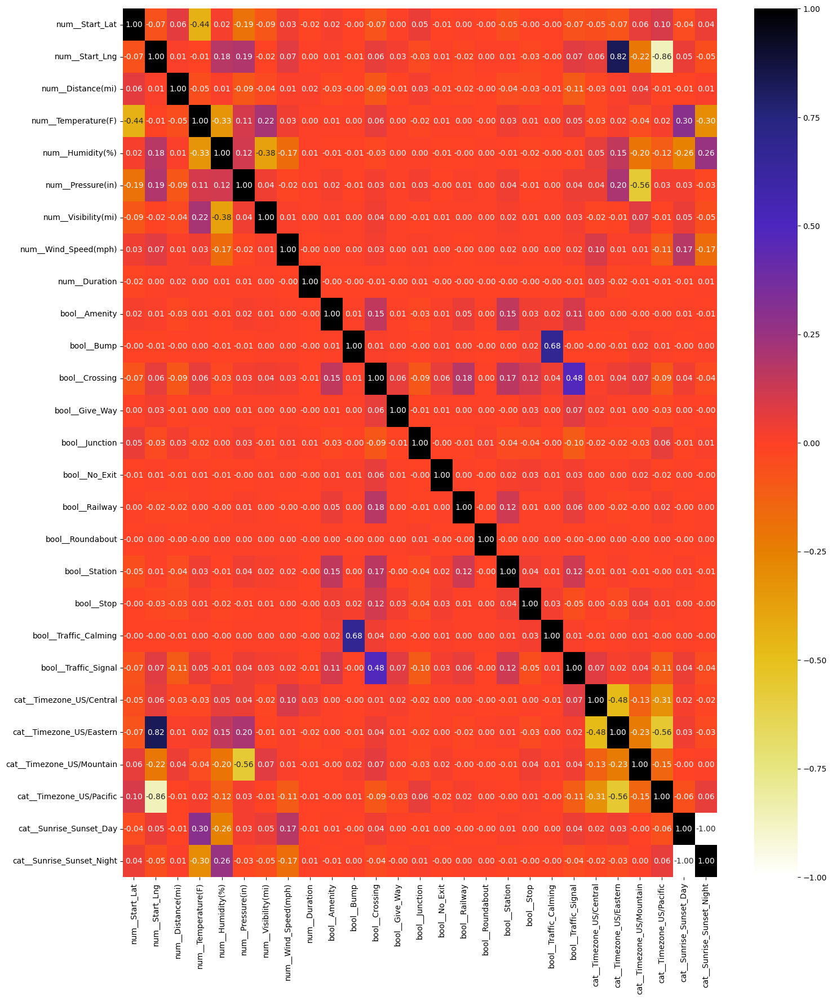

In [60]:
import seaborn as sns
#Using Pearson Correlation
plt.figure(figsize=(17,20))
cor = X_train_transformed.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r,fmt=".2f")
plt.show()

In [61]:
# we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [62]:
corr_features = correlation(X_train_transformed, 0.85)
len(set(corr_features))

2

In [63]:
corr_features

{'cat__Sunrise_Sunset_Night', 'cat__Timezone_US/Pacific'}

In [22]:
corr_features = ['cat__Sunrise_Sunset_Night', 'cat__Timezone_US/Pacific']

In [23]:
X_train_transformed.drop(columns=corr_features,inplace=True)
X_valid_transformed.drop(columns=corr_features,inplace=True)
X_test_transformed.drop(columns=corr_features,inplace=True)

## Model Training and hyperparameter tunning

In [24]:
X_train_transformed.shape

(5796295, 25)

In [25]:
X_valid_transformed.shape

(1159259, 25)

**Create an Evaluate Function to give all metrics after model Training**

In [26]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model(true, predicted):
    accuracy = accuracy_score(true, predicted)
    precision = precision_score(true, predicted, average='weighted') # Use 'weighted' for multi-class
    recall = recall_score(true, predicted, average='weighted')
    f1 = f1_score(true, predicted, average='weighted')
    return accuracy, precision, recall, f1

In [29]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 5.6 MB/s eta 0:00:00


In [30]:
!pip install xgboost

In [27]:
!pip install lightgbm

In [31]:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import LassoCV
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:

models = {
    "Logistic Regression": LogisticRegression(n_jobs=-1),
    "Ridge Classifier": RidgeClassifier(),
    "Lasso CV": LassoCV(),
    "SGD Classifier": SGDClassifier(n_jobs=-1),
    "K-Neighbors Classifier": KNeighborsClassifier(n_jobs=-1),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(n_jobs=-1),
    "LightGBM": LGBMClassifier(),
    "SVM": SVC(),
    "XGBClassifier": XGBClassifier(n_jobs=-1),
    "CatBoosting Classifier": CatBoostClassifier(verbose=False),
    "AdaBoost Classifier": AdaBoostClassifier(),
}

model_list = []
accuracy_list =[]

for i in range(len(list(models))):
    model = list(models.values())[i]
    model.fit(X_train_transformed, y_train) # Train model

    # Make predictions
    y_train_pred = model.predict(X_train_transformed)
    y_valid_pred = model.predict(X_valid_transformed)

    # Evaluate Train and Test dataset
    model_train_accuracy, model_train_precision, model_train_recall, model_train_f1 = evaluate_model(y_train, y_train_pred)
    model_valid_accuracy, model_valid_precision, model_valid_recall, model_valid_f1 = evaluate_model(y_valid, y_valid_pred)

    print(list(models.keys())[i])
    model_list.append(list(models.keys())[i])

    print('Model performance for Training set')
    print("- Accuracy: {:.4f}".format(model_train_accuracy))
    print("- Precision: {:.4f}".format(model_train_precision))
    print("- Recall: {:.4f}".format(model_train_recall))
    print("- F1 Score: {:.4f}".format(model_train_f1))

    print('----------------------------------')

    print('Model performance for Test set')
    print("- Accuracy: {:.4f}".format(model_valid_accuracy))
    print("- Precision: {:.4f}".format(model_valid_precision))
    print("- Recall: {:.4f}".format(model_valid_recall))
    print("- F1 Score: {:.4f}".format(model_valid_f1))
    accuracy_list.append(model_valid_accuracy)

    print('='*35)
    print('\n')




In [72]:
models = {
    # "Logistic Regression": LogisticRegression(n_jobs=-1),
    # "Ridge Classifier": RidgeClassifier(),
    # "Lasso CV": LassoCV(),
    "SGD Classifier": SGDClassifier(n_jobs=-1),
    "LightGBM": LGBMClassifier(),
    "Random Forest": RandomForestClassifier(n_jobs=-1),
    # "K-Neighbors Classifier": KNeighborsClassifier(n_jobs=-1),
    # "Decision Tree": DecisionTreeClassifier(),
    # "Random Forest": RandomForestClassifier(n_jobs=-1),
    # "SVM": SVC(),
    # "XGBClassifier": XGBClassifier(n_jobs=-1),
    # "CatBoosting Classifier": CatBoostClassifier(verbose=False),
    # "AdaBoost Classifier": AdaBoostClassifier(),
}

model_list = []
accuracy_list =[]

for i in range(len(list(models))):
    model = list(models.values())[i]
    model.fit(X_train_transformed, y_train) # Train model

    # Make predictions
    y_train_pred = model.predict(X_train_transformed)
    y_valid_pred = model.predict(X_valid_transformed)

    # Evaluate Train and Test dataset
    model_train_accuracy, model_train_precision, model_train_recall, model_train_f1 = evaluate_model(y_train, y_train_pred)
    model_valid_accuracy, model_valid_precision, model_valid_recall, model_valid_f1 = evaluate_model(y_valid, y_valid_pred)

    print(list(models.keys())[i])
    model_list.append(list(models.keys())[i])

    print('Model performance for Training set')
    print("- Accuracy: {:.4f}".format(model_train_accuracy))
    print("- Precision: {:.4f}".format(model_train_precision))
    print("- Recall: {:.4f}".format(model_train_recall))
    print("- F1 Score: {:.4f}".format(model_train_f1))

    print('----------------------------------')

    print('Model performance for Test set')
    print("- Accuracy: {:.4f}".format(model_valid_accuracy))
    print("- Precision: {:.4f}".format(model_valid_precision))
    print("- Recall: {:.4f}".format(model_valid_recall))
    print("- F1 Score: {:.4f}".format(model_valid_f1))
    accuracy_list.append(model_valid_accuracy)

    print('='*35)
    print('\n')




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


SGD Classifier
Model performance for Training set
- Accuracy: 0.7968
- Precision: 0.6349
- Recall: 0.7968
- F1 Score: 0.7067
----------------------------------
Model performance for Test set
- Accuracy: 0.7963
- Precision: 0.6341
- Recall: 0.7963
- F1 Score: 0.7060


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.383977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1696
[LightGBM] [Info] Number of data points in the train set: 5796295, number of used features: 25
[LightGBM] [Info] Start training from score -4.742367
[LightGBM] [Info] Start training from score -0.227153
[LightGBM] [Info] Start training from score -1.783826
[LightGBM] [Info] Start training from score -3.631039
LightGBM
Model performance for Training set
- Accuracy: 0.8448
- Precision: 0.8287
- Recall: 0.8448
- F1 Score: 0.8251
----------------------------------
Model p

In [ ]:
# Logistic Regression
# Model performance for Training set
# - Accuracy: 0.7966
# - Precision: 0.7308
# - Recall: 0.7966
# - F1 Score: 0.7071
# ----------------------------------
# Model performance for Test set
# - Accuracy: 0.7961
# - Precision: 0.7297
# - Recall: 0.7961
# - F1 Score: 0.7065
# ===================================


# /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
#   _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
# /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
#   _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
# Ridge Classifier
# Model performance for Training set
# - Accuracy: 0.7968
# - Precision: 0.6612
# - Recall: 0.7968
# - F1 Score: 0.7067
# ----------------------------------
# Model performance for Test set
# - Accuracy: 0.7963
# - Precision: 0.6557
# - Recall: 0.7963
# - F1 Score: 0.7060
# ===================================

Logistic Regression
Model performance for Training set
- Accuracy: 0.7966
- Precision: 0.7308
- Recall: 0.7966
- F1 Score: 0.7071
----------------------------------
Model performance for Valid set
- Accuracy: 0.7961
- Precision: 0.7297
- Recall: 0.7961
> F1 Score: 0.7065

===================================

Ridge Classifier
Model performance for Training set
- Accuracy: 0.7968
- Precision: 0.6612
- Recall: 0.7968
- F1 Score: 0.7067
----------------------------------
Model performance for Valid set
- Accuracy: 0.7963
- Precision: 0.6557
- Recall: 0.7963
> F1 Score: 0.7060

===================================

SGD Classifier
Model performance for Training set
- Accuracy: 0.7968
- Precision: 0.6349
- Recall: 0.7968
- F1 Score: 0.7067
----------------------------------
Model performance for Valid set
- Accuracy: 0.7963
- Precision: 0.6341
- Recall: 0.7963
> F1 Score: 0.7060

===================================

LightGBM
Model performance for Training set
- Accuracy: 0.8448
- Precision: 0.8287
- Recall: 0.8448
- F1 Score: 0.8251
----------------------------------
Model performance for Valid set
- Accuracy: 0.8442
- Precision: 0.8274
- Recall: 0.8442
> F1 Score: 0.8244

===================================

Random Forest
Model performance for Training set
- Accuracy: 0.9951
- Precision: 0.9950
- Recall: 0.9951
- F1 Score: 0.9950
----------------------------------
Model performance for Valid set
- Accuracy: 0.8757
- Precision: 0.8663
- Recall: 0.8757
> F1 Score: 0.8665

===================================

**⚠ Due limited gpu resources it's unable to hyperparameter tunning**

In [ ]:
# # Hyperparameter Tunning

# from sklearn.model_selection import RandomizedSearchCV

# # Define the parameter distributions for each model
# param_distributions = {
#     "Logistic Regression": {
#         'C': [0.001, 0.01, 0.1, 1, 10, 100],
#         'penalty': ['l1', 'l2', 'elasticnet', 'none'],
#         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
#         'max_iter': [100, 500,1000]
#     },
#     "Ridge Classifier": {
#         'alpha': [0.1, 1, 10, 100]
#     },
#     "Lasso CV": {
#         'eps': [0.001,0.01,0.1,1],
#         'n_alphas': [100,200,500],
#         'max_iter': [1000, 5000, 10000]

#     },
#     "SGD Classifier": {
#         'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
#         'penalty': ['l1', 'l2', 'elasticnet'],
#         'alpha': [0.0001, 0.001, 0.01],
#         'max_iter': [1000,5000,10000]
#     },
#     "K-Neighbors Classifier": {
#         'n_neighbors': [3, 5, 7, 9],
#         'weights': ['uniform', 'distance'],
#         'p': [1, 2]
#     },
#     "Decision Tree": {
#         'max_depth': [None, 10, 20, 30],
#         'min_samples_split': [2, 5, 10],
#         'min_samples_leaf': [1, 2, 4]
#     },
#     "Random Forest": {
#         'n_estimators': [50, 100, 200],
#         'max_depth': [None, 10, 20, 30],
#         'min_samples_split': [2, 5, 10],
#         'min_samples_leaf': [1, 2, 4]
#     },
#     "LightGBM": {
#         'num_leaves': [31, 50, 100],
#         'learning_rate': [0.01, 0.1, 0.5],
#         'n_estimators': [50, 100, 200]
#     },
#     "SVM": {
#         'C': [0.1, 1, 10],
#         'kernel': ['linear', 'rbf', 'poly'],
#         'gamma': ['scale', 'auto']
#     },
#     "XGBClassifier": {
#         'n_estimators': [50, 100, 200],
#         'learning_rate': [0.01, 0.1, 0.5],
#         'max_depth': [3, 5, 7]
#     },
#     "CatBoosting Classifier": {
#         'iterations': [100, 200,500],
#         'learning_rate': [0.01, 0.1, 0.5],
#         'depth': [4, 6, 8]
#     },
#     "AdaBoost Classifier": {
#         'n_estimators': [50, 100, 200],
#         'learning_rate': [0.01, 0.1, 1]
#     }
# }


# # Perform RandomizedSearchCV for each model
# best_models = {}
# for model_name, model in models.items():
#     random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions[model_name], n_iter=5, cv=3, scoring='accuracy', n_jobs=-1, verbose=1, random_state=42)
#     random_search.fit(X_train_transformed, y_train)
#     best_models[model_name] = random_search.best_estimator_
#     print(f"Best parameters for {model_name}: {random_search.best_params_}")
#     print(f"Best score for {model_name}: {random_search.best_score_}")

In [ ]:
# # hyperparametertunning lightgbm

# from sklearn.model_selection import RandomizedSearchCV

# # Define the parameter distributions for LightGBM
# param_distributions = {
#         'num_leaves': [31, 50, 100],
#         'learning_rate': [0.01, 0.1, 0.5],
#         'n_estimators': [50, 100, 200]
#     }

# # Initialize LightGBM Classifier
# lgbm_model = LGBMClassifier()


# # Perform RandomizedSearchCV
# random_search = RandomizedSearchCV(
#     estimator=lgbm_model,
#     param_distributions=param_distributions,
#     n_iter=5, cv=3, scoring='accuracy', n_jobs=-1, verbose=1, random_state=42
# )

# random_search.fit(X_train_transformed, y_train)

# # Print the best hyperparameters and score
# print(f"Best parameters for LightGBM: {random_search.best_params_}")
# print(f"Best score for LightGBM: {random_search.best_score_}")

# # Get the best model
# best_lgbm_model = random_search.best_estimator_

# # Evaluate the best model
# y_pred = best_lgbm_model.predict(X_valid_transformed)
# accuracy, precision, recall, f1 = evaluate_model(y_valid, y_pred)
# print(f"Validation Accuracy: {accuracy}")
# print(f"Validation Precision: {precision}")
# print(f"Validation Recall: {recall}")
# print(f"Validation F1 Score: {f1}")

**LGBMCLASSIFIER**

In [32]:
model = LGBMClassifier()

model = model.fit(X_train_transformed, y_train) # Train model

# Make predictions
y_train_pred = model.predict(X_train_transformed)
y_test_pred = model.predict(X_test_transformed)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.844392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1696
[LightGBM] [Info] Number of data points in the train set: 5796295, number of used features: 25
[LightGBM] [Info] Start training from score -4.742367
[LightGBM] [Info] Start training from score -0.227153
[LightGBM] [Info] Start training from score -1.783826
[LightGBM] [Info] Start training from score -3.631039


In [33]:
# Evaluate Train and Test dataset
model_train_accuracy, model_train_precision, model_train_recall, model_train_f1 = evaluate_model(y_train, y_train_pred)
model_test_accuracy, model_test_precision, model_test_recall, model_test_f1 = evaluate_model(y_test, y_test_pred)



print('Model performance for Training set')
print("- Accuracy: {:.4f}".format(model_train_accuracy))
print("- Precision: {:.4f}".format(model_train_precision))
print("- Recall: {:.4f}".format(model_train_recall))
print("- F1 Score: {:.4f}".format(model_train_f1))

print('----------------------------------')

print('Model performance for Test set')
print("- Accuracy: {:.4f}".format(model_test_accuracy))
print("- Precision: {:.4f}".format(model_test_precision))
print("- Recall: {:.4f}".format(model_test_recall))
print("- F1 Score: {:.4f}".format(model_test_f1))


Model performance for Training set
- Accuracy: 0.8448
- Precision: 0.8287
- Recall: 0.8448
- F1 Score: 0.8251
----------------------------------
Model performance for Test set
- Accuracy: 0.8432
- Precision: 0.8266
- Recall: 0.8432
- F1 Score: 0.8233


In [34]:
# save lightgbm model

import joblib

# Assuming 'best_lgbm_model' is your trained LightGBM model
joblib.dump(model, 'lgbm_model.joblib')

['lgbm_model.joblib']

# Sample Test prediction

In [ ]:
# preprocessor= joblib.load('/content/preprocessor.joblib')

# model = joblib.load('/content/lgbm_model.joblib')



# test = pd.read_csv("/content/test.csv")

# test = test.drop(columns=['ID','Source', 'End_Lat',	'End_Lng', 'Weather_Timestamp',	'Description',	'Street',	'City',	'County',	'State',	'Zipcode','Country',	'Airport_Code',	'Wind_Chill(F)',	'Wind_Direction',	'Precipitation(in)',	'Weather_Condition','Turning_Loop','Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight','Severity'])

# if 'Unnamed: 0' in test.columns:
#   test.drop(columns=['Unnamed: 0'],inplace=True)

# # using format='mixed' and errors='coerce' to handle different formats and invalid values
# test['Start_Time'] = pd.to_datetime(test['Start_Time'], format='mixed', errors='coerce')
# test['End_Time'] = pd.to_datetime(test['End_Time'], format='mixed', errors='coerce')

# # Now calculate the duration
# test['Duration'] = (test['End_Time'] - test['Start_Time']).dt.total_seconds() / 60

# test.drop(columns=['Start_Time', 'End_Time'], inplace=True)

# test_preprocess=pd.DataFrame(preprocessor.transform(test), columns=preprocessor.get_feature_names_out())

# corr_features = {'cat__Sunrise_Sunset_Night', 'cat__Timezone_US/Pacific'}
# # Check if all features in the set are present in the columns:
# if corr_features.issubset(test_preprocess.columns):
#     test_preprocess.drop(columns=corr_features, inplace=True)

# prediction = model.predict(test_preprocess)
# prediction

In [86]:
test = pd.read_csv("/content/test.csv")
test.head()

,Unnamed: 0,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,3109868,A-3119747,Source2,3,2017-12-10 22:43:49,2017-12-10 23:13:40,37.711384,-122.127563,NaN,NaN,...,False,False,False,False,False,False,Night,Night,Night,Night
1,899214,A-908930,Source2,2,2021-09-08 16:27:18,2021-09-08 16:57:01,41.789242,-87.926682,NaN,NaN,...,False,False,False,False,True,False,Day,Day,Day,Day
2,2913037,A-2922916,Source2,2,2018-03-02 08:13:39,2018-03-02 09:13:22,34.114746,-80.888672,NaN,NaN,...,False,False,False,False,False,False,Day,Day,Day,Day
3,1529201,A-1539040,Source2,2,2020-03-23 07:45:24,2020-03-23 08:15:02,33.670845,-111.999687,NaN,NaN,...,False,False,False,False,False,False,Day,Day,Day,Day
4,4799781,A-4836192,Source1,2,2023-01-16 01:16:38,2023-01-16 02:34:24,38.992000,-76.885889,38.991701,-76.88636,...,False,False,False,False,False,False,Night,Night,Night,Night


In [87]:
test = test.drop(columns=['ID','Source', 'End_Lat',	'End_Lng', 'Weather_Timestamp',	'Description',	'Street',	'City',	'County',	'State',	'Zipcode','Country',	'Airport_Code',	'Wind_Chill(F)',	'Wind_Direction',	'Precipitation(in)',	'Weather_Condition','Turning_Loop','Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight','Severity'])


In [88]:
if 'Unnamed: 0' in test.columns:
  test.drop(columns=['Unnamed: 0'],inplace=True)

In [89]:
# using format='mixed' and errors='coerce' to handle different formats and invalid values
test['Start_Time'] = pd.to_datetime(test['Start_Time'], format='mixed', errors='coerce')
test['End_Time'] = pd.to_datetime(test['End_Time'], format='mixed', errors='coerce')

# Now calculate the duration
test['Duration'] = (test['End_Time'] - test['Start_Time']).dt.total_seconds() / 60

test.drop(columns=['Start_Time', 'End_Time'], inplace=True)

In [90]:
test.dtypes

,0
Start_Lat,float64
Start_Lng,float64
Distance(mi),float64
Timezone,object
Temperature(F),float64
Humidity(%),float64
Pressure(in),float64
Visibility(mi),float64
Wind_Speed(mph),float64
Amenity,bool


In [91]:
preprocessor= joblib.load('/content/preprocessor.joblib')

In [92]:
test_preprocess=pd.DataFrame(preprocessor.transform(test), columns=preprocessor.get_feature_names_out())

In [93]:
test_preprocess.head()

,num__Start_Lat,num__Start_Lng,num__Distance(mi),num__Temperature(F),num__Humidity(%),num__Pressure(in),num__Visibility(mi),num__Wind_Speed(mph),num__Duration,bool__Amenity,...,bool__Station,bool__Stop,bool__Traffic_Calming,bool__Traffic_Signal,cat__Timezone_US/Central,cat__Timezone_US/Eastern,cat__Timezone_US/Mountain,cat__Timezone_US/Pacific,cat__Sunrise_Sunset_Day,cat__Sunrise_Sunset_Night
0,0.297949,-1.577062,-0.320525,-0.678933,-0.568127,0.732872,0.341745,-0.362680,-0.030721,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
1,1.101261,0.389405,-0.320525,0.815152,-1.365813,-0.379627,0.341745,1.598159,-0.030731,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
2,-0.410566,0.794073,-0.320525,-0.354594,-1.099918,0.542444,0.341745,0.290933,-0.028483,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,-0.498012,-0.994734,-0.320525,-0.567276,0.672717,-1.141338,0.341745,-1.477667,-0.030737,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,0.550222,1.024223,-0.301682,-1.896533,0.273874,0.492332,0.341745,-1.477667,-0.027130,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [96]:
corr_features = {'cat__Sunrise_Sunset_Night', 'cat__Timezone_US/Pacific'}
# Check if all features in the set are present in the columns:
if corr_features.issubset(test_preprocess.columns):
    test_preprocess.drop(columns=corr_features, inplace=True)

In [98]:
test_preprocess.shape

(100, 25)

In [99]:
model = joblib.load('/content/lgbm_model.joblib')

prediction = model.predict(test_preprocess)
prediction

array([3, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 2, 3,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2,
       3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

# Streamlit

In [ ]:
import streamlit as st
import pandas as pd
import numpy as np
import joblib

# Load the pre-trained preprocessor and model
preprocessor = joblib.load('/content/preprocessor.joblib')
model = joblib.load('/content/lgbm_model.joblib')

# App title
st.title("Severity Prediction App")
st.write("""
This app allows you to upload a CSV or Parquet file, preprocess it, and predict the `Severity` column using the trained model.
""")

# File uploader
uploaded_file = st.file_uploader("Upload a CSV or Parquet file", type=["csv", "parquet"])

if uploaded_file:
    # Read uploaded file
    file_type = uploaded_file.name.split('.')[-1]
    if file_type == "csv":
        data = pd.read_csv(uploaded_file)
    elif file_type == "parquet":
        data = pd.read_parquet(uploaded_file)

    # Display the uploaded data
    st.write("Uploaded Data Preview:")
    st.dataframe(data.head())

    try:
        # Drop unnecessary columns
        drop_columns = [
            'ID', 'Source', 'End_Lat', 'End_Lng', 'Weather_Timestamp', 'Description',
            'Street', 'City', 'County', 'State', 'Zipcode', 'Country', 'Airport_Code',
            'Wind_Chill(F)', 'Wind_Direction', 'Precipitation(in)', 'Weather_Condition',
            'Turning_Loop', 'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight',
            'Severity'
        ]
        data = data.drop(columns=[col for col in drop_columns if col in data.columns], errors='ignore')

        # Handle datetime and calculate duration
        data['Start_Time'] = pd.to_datetime(data['Start_Time'], format='mixed', errors='coerce')
        data['End_Time'] = pd.to_datetime(data['End_Time'], format='mixed', errors='coerce')
        data['Duration'] = (data['End_Time'] - data['Start_Time']).dt.total_seconds() / 60
        data = data.drop(columns=['Start_Time', 'End_Time'], errors='ignore')

        # Preprocess the data
        test_preprocessed = pd.DataFrame(preprocessor.transform(data), columns=preprocessor.get_feature_names_out())

        # Drop specific correlated features if present
        corr_features = {'cat__Sunrise_Sunset_Night', 'cat__Timezone_US/Pacific'}
        if corr_features.issubset(test_preprocessed.columns):
            test_preprocessed.drop(columns=corr_features, inplace=True)

        # Predict using the model
        predictions = model.predict(test_preprocessed)
        data['Severity'] = predictions

        # Display the results
        st.write("Predicted Data Preview:")
        st.dataframe(data.head())

        # Allow users to download the file
        @st.cache_data
        def convert_df(df):
            return df.to_csv(index=False).encode('utf-8')

        csv_data = convert_df(data)
        st.download_button(
            label="Download Predicted Data as CSV",
            data=csv_data,
            file_name="predicted_data.csv",
            mime="text/csv"
        )
    except Exception as e:
        st.error(f"An error occurred during processing: {e}")


# README.md

In [ ]:


# Accident Severity Prediction

This project focuses on predicting the severity of traffic accidents using machine learning.  The model is trained on a dataset of accident records, and then deployed using Streamlit for user-friendly prediction.

## Data Size Comparison

| File Type | Size (GB)                                            |
|---|--------------------------------------------------------------|
| Original CSV  |  2.8 GB  |
| Parquet (after comparison) | 0.7 GB |

## Data and Preprocessing

The project utilizes a dataset of traffic accidents containing various features such as location, time, weather conditions, and more.  Crucially, the `Severity` column serves as the target variable for prediction.

**Preprocessing steps include:**

* Dropping irrelevant or redundant columns.
* Converting `Start_Time` and `End_Time` to datetime objects and calculating the `Duration` of the accident.
* Handling missing values and converting data types as necessary.
* Feature scaling and encoding using a `ColumnTransformer` which is saved using `joblib`.

## Model Training

Multiple classification models are evaluated:

* SGD Classifier
* LightGBM
* Random Forest
*(Other models like Logistic Regression, Ridge Classifier, K-Neighbors Classifier, Decision Tree, SVM, XGBClassifier, CatBoosting Classifier, and AdaBoost Classifier were initially considered but final model used was LightGBM)*

The models are trained and evaluated using metrics such as Accuracy, Precision, Recall, and F1 Score.

Due to resource constraints, hyperparameter tuning was not performed exhaustively. However, the best model was selected and saved for deployment.

**The Final Model:**

A LightGBM classifier was selected as the final model due to good performance.  The model is saved using `joblib` for later use.

## Deployment (Streamlit App)

The trained LightGBM model and preprocessor are deployed using Streamlit to create a user-friendly web application.

**App Features:**

* File upload: Users can upload CSV or Parquet files containing accident data.
* Data preview: Displays a preview of the uploaded data.
* Prediction: The app preprocesses the uploaded data and uses the trained model to predict the `Severity` of the accidents.
* Download: Users can download the predicted data as a CSV file.

**How to run the Streamlit app:**

1. Install the required libraries:
   ```bash
   pip install -r requirements.txt
   ```

2. Run the Streamlit app:
   ```bash
   streamlit run app.py
   ```

## Usage

1. Visit the app in your browser.
2. Upload a CSV or Parquet file with the necessary features.
3. The app will predict the `Severity` and display the results.
4. Download the predictions as a CSV file.


## Further Development

* **More comprehensive hyperparameter tuning**  to optimize model performance.
* **Exploring additional features or data sources** to enhance the model's accuracy.
* **Investigating alternative models**  that could provide further improvement.
* **Deploy the app to a cloud platform** for greater accessibility.